In [3]:
import matplotlib.pyplot as pl
import tensorflow as tf
import numpy as np
import cv2
import os
import PIL
import pathlib
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from sklearn.metrics import confusion_matrix
from google.colab import drive

from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, MaxPooling2D
from keras.optimizers import RMSprop,Adam
from keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.layers import BatchNormalization

resources:
https://www.tensorflow.org/tutorials/load_data/images    
https://medium.com/nerd-for-tech/building-an-image-classifier-with-tensorflow-3e12c1d5d3a2


In [ ]:
drive.mount('/content/drive', force_remount=True)


Mounted at /content/drive


In [ ]:
!unzip '/content/drive/MyDrive/data.zip'

Archive:  /content/drive/MyDrive/data.zip
replace __MACOSX/._data? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [23]:
import os
import shutil

# Paths
train_dir = 'data/outputFrames/train/'
test_dir = 'data/outputFrames/test/'

# Ensure train subdirectories exist and move files
for sub_dir in os.listdir(test_dir):
    test_sub_dir = os.path.join(test_dir, sub_dir)
    train_sub_dir = os.path.join(train_dir, sub_dir)

    # Skip if not a directory
    if not os.path.isdir(test_sub_dir):
        continue

    # Create the train subdirectory if it doesn't exist
    os.makedirs(train_sub_dir, exist_ok=True)

    # Move files from test subdirectory to train subdirectory
    for file_name in os.listdir(test_sub_dir):
        test_file_path = os.path.join(test_sub_dir, file_name)
        train_file_path = os.path.join(train_sub_dir, file_name)

        # Move the file
        shutil.move(test_file_path, train_file_path)

print("All files moved from test to train subdirectories.")


All files moved from test to train subdirectories.


In [1]:
import os
import shutil

# Define paths
train_dir = 'data/outputFrames/train/'
limited_dir = 'data/outputFrames/train_limited/'  # New directory for limited dataset
max_images_per_class = 18000

# Create the limited directory
os.makedirs(limited_dir, exist_ok=True)

# Process each class
for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name)
    if os.path.isdir(class_path):  # Check if it's a directory
        # Create corresponding directory in the limited dataset folder
        limited_class_path = os.path.join(limited_dir, class_name)
        os.makedirs(limited_class_path, exist_ok=True)

        # Get all image files in the class directory
        images = sorted(os.listdir(class_path))  # Sorting ensures consistent order
        images = [img for img in images if img.lower().endswith(('.png', '.jpg', '.jpeg'))]

        # Copy the first 18000 images
        for img in images[:max_images_per_class]:
            src = os.path.join(class_path, img)
            dst = os.path.join(limited_class_path, img)
            shutil.copyfile(src, dst)

print("Dataset limited to first 18000 images per class.")


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.


KeyboardInterrupt



In [18]:
# Define paths
train_dir = 'data/outputFrames/train_limited/'

# Parameters
batch_size = 16
img_height = 128
img_width = 128

# Load training dataset
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    train_dir,
    batch_size=batch_size,
    image_size=(img_height, img_width),
    seed=123,
    validation_split=0.2,
    subset="training"
)

# Load testing dataset
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    train_dir,
    batch_size=batch_size,
    image_size=(img_height, img_width),
    seed=123,
    validation_split=0.2,
    subset="validation"
)


Found 215999 files belonging to 12 classes.
Using 172800 files for training.
Found 215999 files belonging to 12 classes.
Using 43199 files for validation.


In [19]:
class_names = train_ds.class_names
print(class_names)

['step_1', 'step_10', 'step_11', 'step_12', 'step_2', 'step_3', 'step_4', 'step_5', 'step_6', 'step_7', 'step_8', 'step_9']


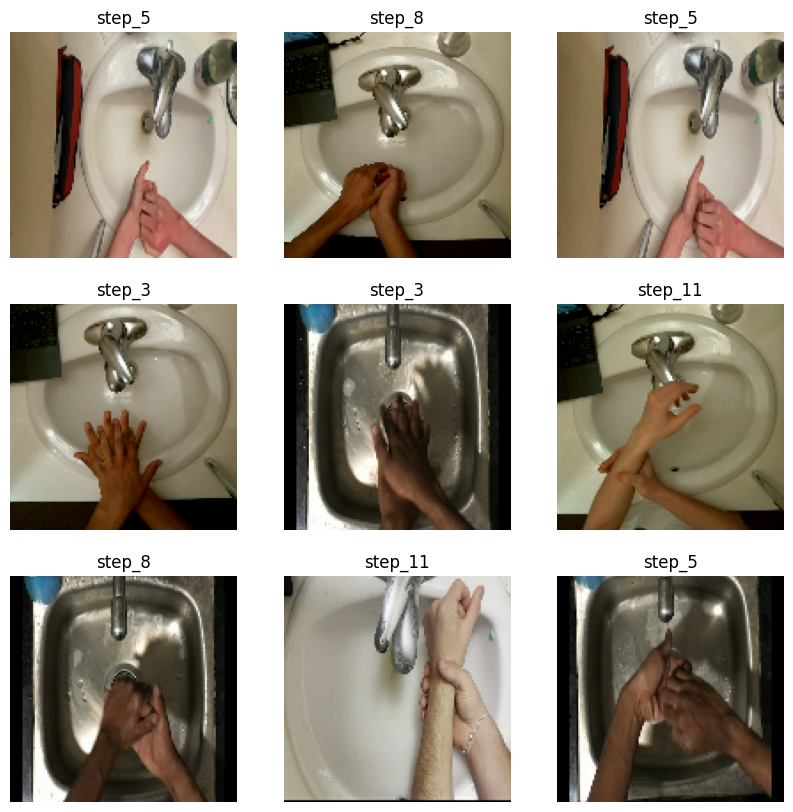

In [20]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [21]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(16, 128, 128, 3)
(16,)


In [22]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [23]:
normalization_layer = layers.Rescaling(1./255)
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.0 1.0


In [24]:
data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal",
                      input_shape=(img_height,
                                  img_width,
                                  3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
  ]
)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [25]:
num_classes = 12

model = Sequential([
    # Data augmentation
    data_augmentation,

    # Normalization
    layers.Rescaling(1./255),

    # First Conv Block
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    BatchNormalization(),
    layers.MaxPooling2D(pool_size=(2, 2)),

    # Second Conv Block
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    BatchNormalization(),
    layers.MaxPooling2D(pool_size=(2, 2)),

    # Third Conv Block
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    BatchNormalization(),
    layers.MaxPooling2D(pool_size=(2, 2)),

    # Regularization
    layers.Dropout(0.5),

    # Fully Connected Layers
    layers.Flatten(),
    layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)),
    BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(num_classes, activation='softmax')
])


In [26]:
model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ sequential_2 (Sequential)            │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ rescaling_3 (Rescaling)              │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 128, 128, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 128, 128, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 64, 64, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 64, 64, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 32768)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 256)                 │       8,388,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 12)                  │           3,084 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,487,116 (32.38 MB)

 Trainable params: 8,486,156 (32.37 MB)

 Non-trainable params: 960 (3.75 KB)

In [27]:
# Define the optimizer
optimizer = Adam(learning_rate=0.0001)
model.compile(optimizer=optimizer,
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [28]:
epochs=5
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/5
10800/10800 ━━━━━━━━━━━━━━━━━━━━ 299s 27ms/step - accuracy: 0.4520 - loss: 5.0438 - val_accuracy: 0.8666 - val_loss: 1.5832
Epoch 2/5
10800/10800 ━━━━━━━━━━━━━━━━━━━━ 392s 36ms/step - accuracy: 0.7899 - loss: 1.7844 - val_accuracy: 0.8955 - val_loss: 1.4303
Epoch 3/5
10800/10800 ━━━━━━━━━━━━━━━━━━━━ 305s 28ms/step - accuracy: 0.8491 - loss: 1.5296 - val_accuracy: 0.9086 - val_loss: 1.2665
Epoch 4/5
10800/10800 ━━━━━━━━━━━━━━━━━━━━ 319s 30ms/step - accuracy: 0.8755 - loss: 1.3843 - val_accuracy: 0.9575 - val_loss: 1.1040
Epoch 5/5
10800/10800 ━━━━━━━━━━━━━━━━━━━━ 284s 26ms/step - accuracy: 0.8871 - loss: 1.2955 - val_accuracy: 0.9562 - val_loss: 1.0670


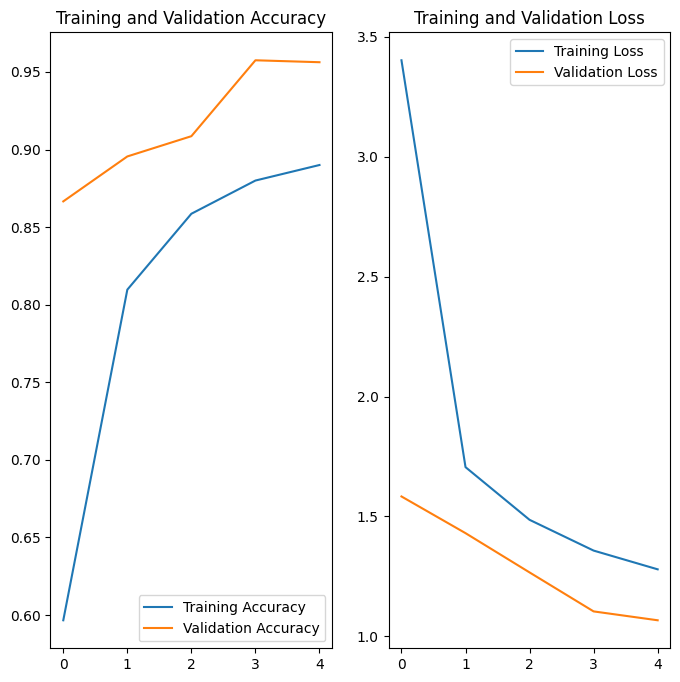

In [29]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [76]:
#this code comes from https://colab.research.google.com/notebooks/snippets/advanced_outputs.ipynb

from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode
from PIL import Image as PILImage
from tensorflow.keras.utils import img_to_array, load_img
import numpy as np
import io
import time
from collections import defaultdict

def initialize_camera():
    """
    JavaScript to select a camera once and keep the video stream running.
    Returns the selected camera's device ID.
    """
    js = Javascript('''
        async function initializeCamera() {
            // Get available video input devices
            const devices = await navigator.mediaDevices.enumerateDevices();
            const videoDevices = devices.filter(device => device.kind === 'videoinput');

            // Create a selection dropdown
            const deviceSelector = document.createElement('select');
            videoDevices.forEach((device, index) => {
                const option = document.createElement('option');
                option.value = device.deviceId;
                option.textContent = device.label || `Camera ${index + 1}`;
                deviceSelector.appendChild(option);
            });

            // Add a confirmation button
            const confirmButton = document.createElement('button');
            confirmButton.textContent = 'Select Camera';
            document.body.appendChild(deviceSelector);
            document.body.appendChild(confirmButton);

            // Wait for the user to select a camera
            const selectedDeviceId = await new Promise((resolve) => {
                confirmButton.onclick = () => resolve(deviceSelector.value);
            });

            // Remove the UI elements after selection
            deviceSelector.remove();
            confirmButton.remove();

            return selectedDeviceId;
        }
    ''')
    display(js)
    return eval_js('initializeCamera()')

def take_photo(device_id, filename='photo.jpg', quality=0.8):
    """
    JavaScript to capture a photo from the selected camera.
    Args:
        device_id: The device ID of the selected camera.
        filename: The filename to save the captured photo.
        quality: The quality of the captured image.

    Returns:
        The filename of the saved photo.
    """
    js = Javascript(f'''
        async function takePhoto(quality) {{
            const video = document.createElement('video');
            const stream = await navigator.mediaDevices.getUserMedia({{
                video: {{ deviceId: {{ exact: "{device_id}" }} }}
            }});
            video.srcObject = stream;
            await video.play();

            const canvas = document.createElement('canvas');
            canvas.width = video.videoWidth;
            canvas.height = video.videoHeight;
            canvas.getContext('2d').drawImage(video, 0, 0);

            // Stop the camera after capture
            stream.getTracks().forEach(track => track.stop());
            video.remove();

            return canvas.toDataURL('image/jpeg', quality);
        }}
    ''')
    display(js)
    data = eval_js('takePhoto({})'.format(quality))
    binary = b64decode(data.split(',')[1])
    with open(filename, 'wb') as f:
        f.write(binary)

    # Display the image
    pil_img = PILImage.open(io.BytesIO(binary))
    display(pil_img)

    return filename

def preprocess_image(image_path, img_height=128, img_width=128, color_mode="rgb"):
    img = load_img(image_path, target_size=(img_height, img_width), color_mode=color_mode)
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, 0)  # Create a batch
    return img_array

def classify_live(model, class_names, img_height=128, img_width=128, fps=1):
    """
    Continuously captures frames using the selected camera,
    preprocesses them, and classifies them in a loop.
    Keeps a running count of predictions for each class.

    Args:
        model: The trained classification model.
        class_names: List of class names corresponding to class indices.
        img_height: Target height for image resizing.
        img_width: Target width for image resizing.
        fps: Frames per second (number of frames to process per second).
    """
    # Initialize the camera and select once
    print("Initializing camera. Please select your camera...")
    device_id = initialize_camera()
    print(f"Camera selected: {device_id}")

    # Initialize a dictionary to count predictions
    prediction_counts = defaultdict(int)

    try:
        print("Live classification started. Press 'Interrupt' or stop the cell to exit.")
        while True:
            start_time = time.time()

            # Capture a frame from the selected camera
            filename = take_photo(device_id)
            print(f"Captured frame: {filename}")

            # Preprocess the captured frame
            processed_image = preprocess_image(filename, img_height, img_width)

            # Predict the class
            predictions = model.predict(processed_image)
            predicted_class_idx = np.argmax(predictions, axis=1)[0]
            predicted_class_name = class_names[predicted_class_idx]

            # Update and display the prediction count
            prediction_counts[predicted_class_name] += 1
            print(f"Predicted class: {predicted_class_name}")
            print(f"Prediction counts: {dict(prediction_counts)}")

            # Control capture rate
            elapsed_time = time.time() - start_time
            delay = max(1 / fps - elapsed_time, 0)
            time.sleep(delay)
    except KeyboardInterrupt:
        print("Live classification stopped.")
        print(f"Final prediction counts: {dict(prediction_counts)}")

Initializing camera. Please select your camera...


<IPython.core.display.Javascript object>

Camera selected: c02c2a1f2d49e33d8430dbec65ba974f0c3b7afb005a880ffb65d6cd03a24173
Live classification started. Press 'Interrupt' or stop the cell to exit.


<IPython.core.display.Javascript object>

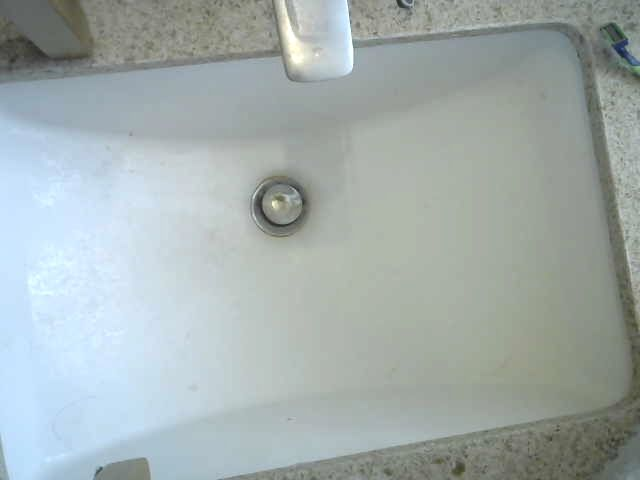

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
Predicted class: step_1
Prediction counts: {'step_1': 1}


<IPython.core.display.Javascript object>

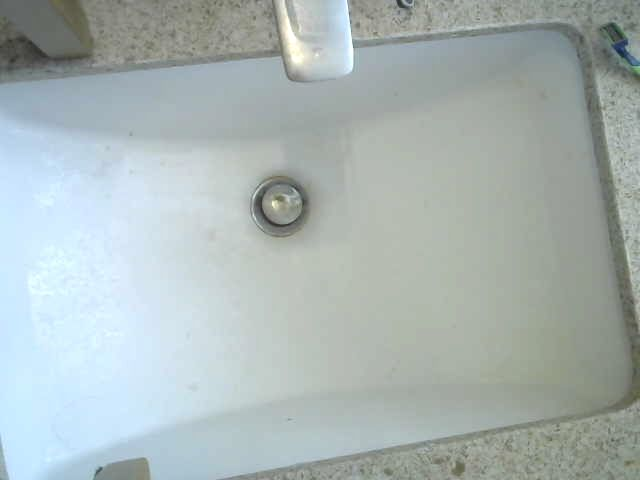

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
Predicted class: step_1
Prediction counts: {'step_1': 2}


<IPython.core.display.Javascript object>

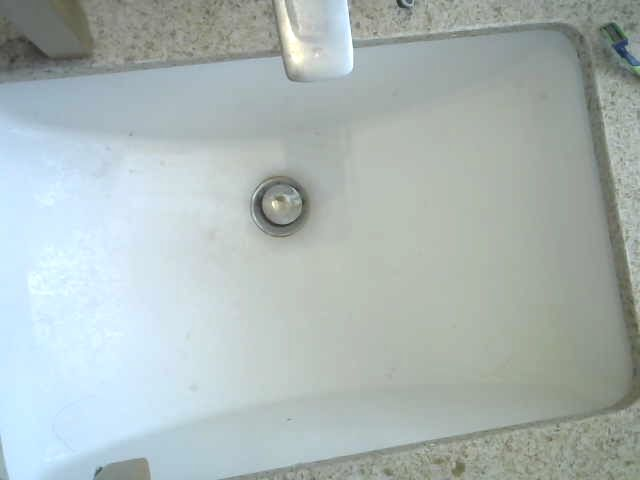

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Predicted class: step_1
Prediction counts: {'step_1': 3}


<IPython.core.display.Javascript object>

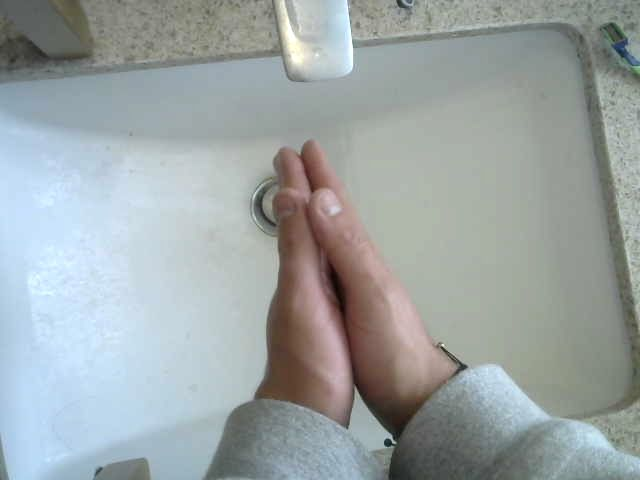

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Predicted class: step_1
Prediction counts: {'step_1': 4}


<IPython.core.display.Javascript object>

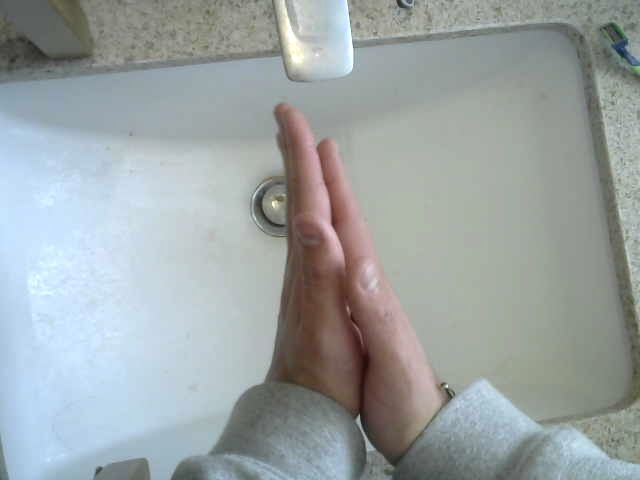

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Predicted class: step_1
Prediction counts: {'step_1': 5}


<IPython.core.display.Javascript object>

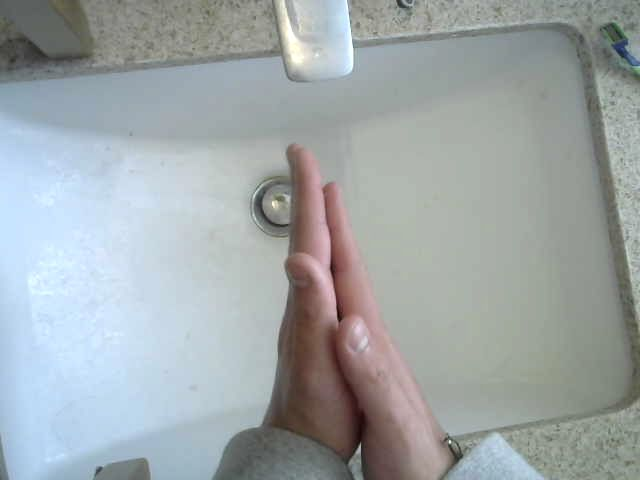

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Predicted class: step_1
Prediction counts: {'step_1': 6}


<IPython.core.display.Javascript object>

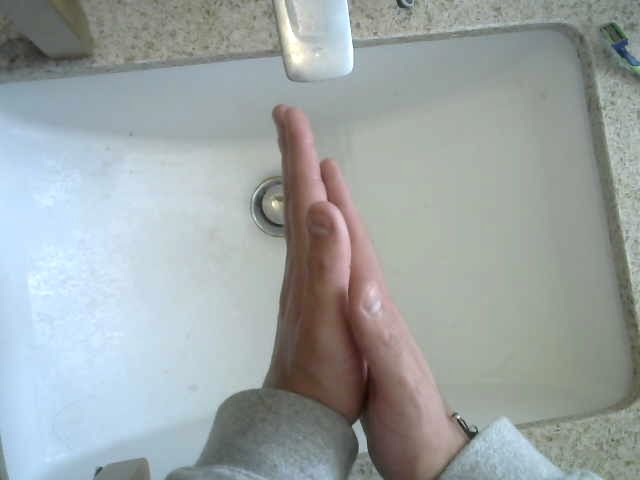

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Predicted class: step_1
Prediction counts: {'step_1': 7}


<IPython.core.display.Javascript object>

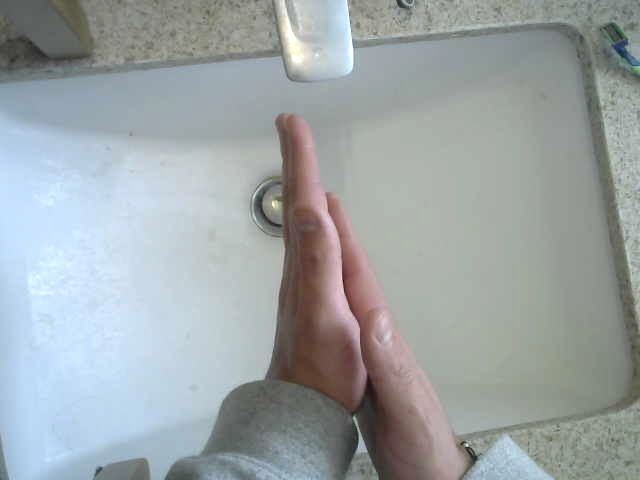

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
Predicted class: step_1
Prediction counts: {'step_1': 8}


<IPython.core.display.Javascript object>

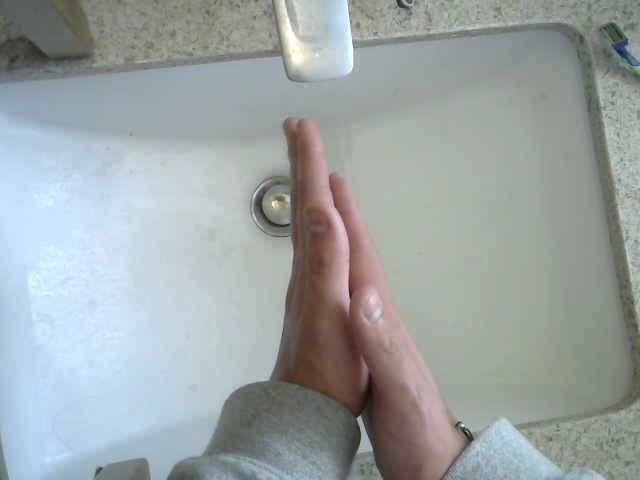

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Predicted class: step_1
Prediction counts: {'step_1': 9}


<IPython.core.display.Javascript object>

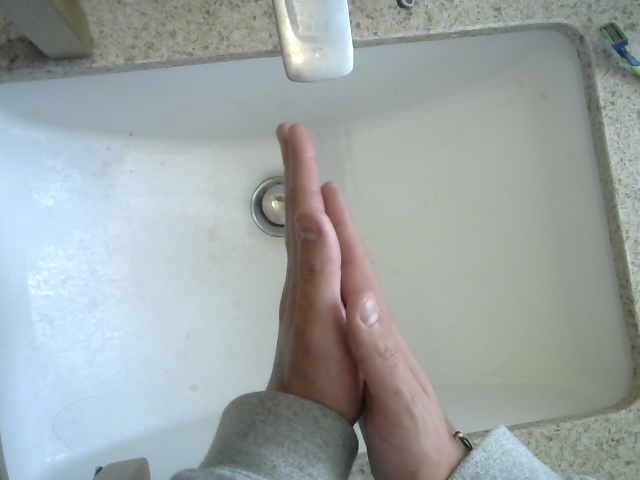

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Predicted class: step_1
Prediction counts: {'step_1': 10}


<IPython.core.display.Javascript object>

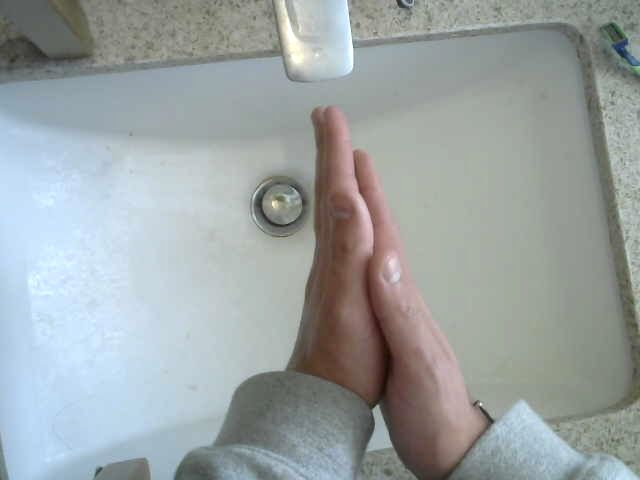

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Predicted class: step_1
Prediction counts: {'step_1': 11}


<IPython.core.display.Javascript object>

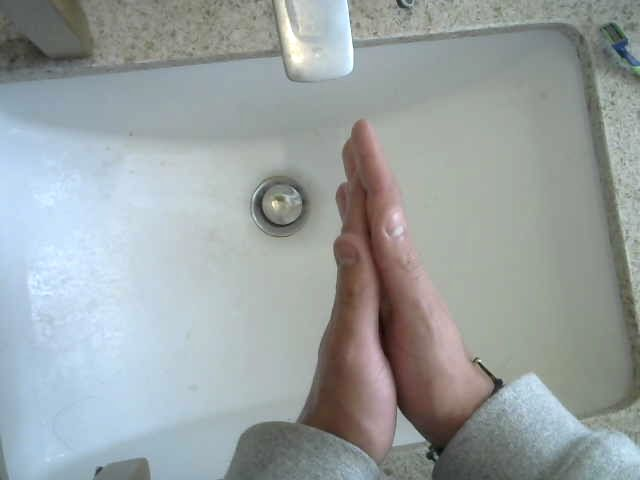

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Predicted class: step_1
Prediction counts: {'step_1': 12}


<IPython.core.display.Javascript object>

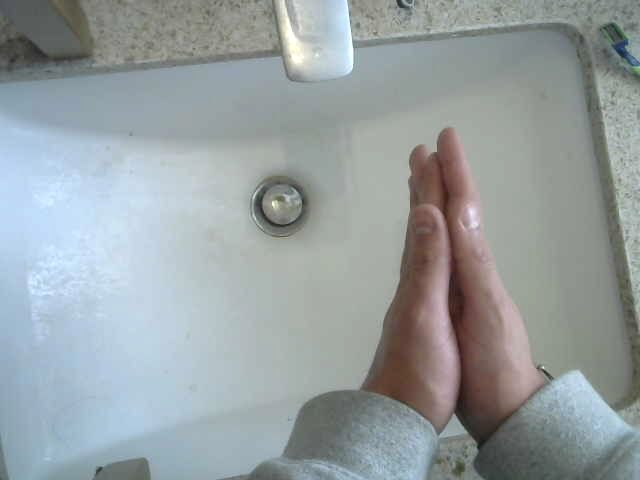

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
Predicted class: step_1
Prediction counts: {'step_1': 13}


<IPython.core.display.Javascript object>

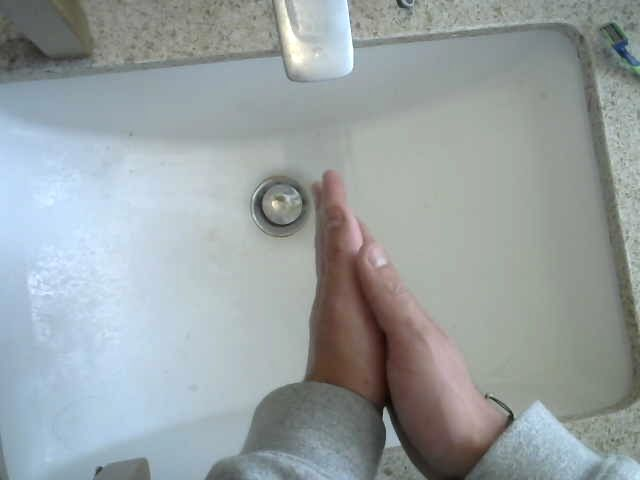

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Predicted class: step_1
Prediction counts: {'step_1': 14}


<IPython.core.display.Javascript object>

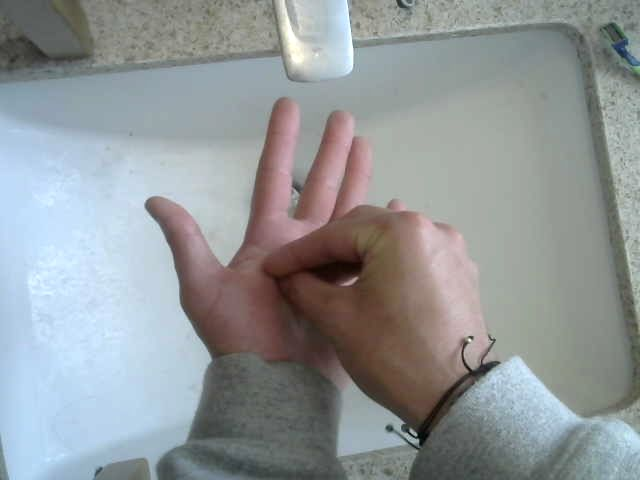

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Predicted class: step_9
Prediction counts: {'step_1': 14, 'step_9': 1}


<IPython.core.display.Javascript object>

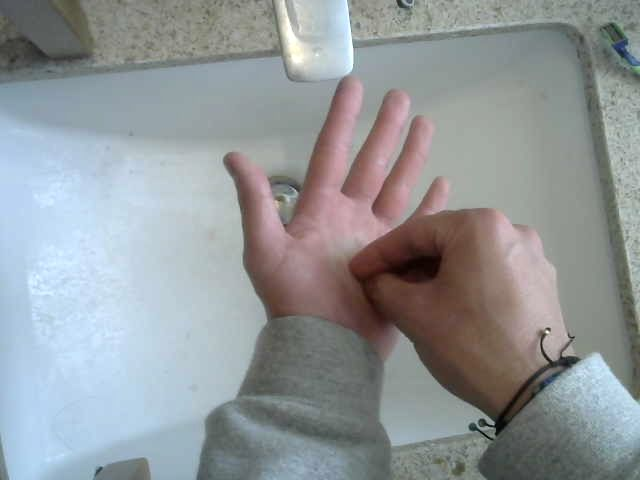

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Predicted class: step_4
Prediction counts: {'step_1': 14, 'step_9': 1, 'step_4': 1}


<IPython.core.display.Javascript object>

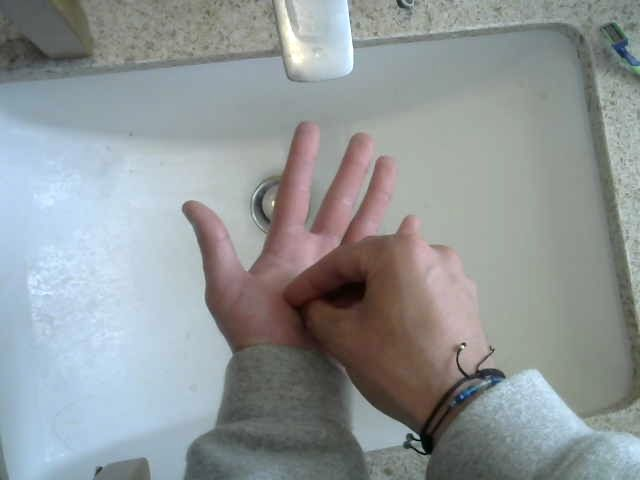

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
Predicted class: step_9
Prediction counts: {'step_1': 14, 'step_9': 2, 'step_4': 1}


<IPython.core.display.Javascript object>

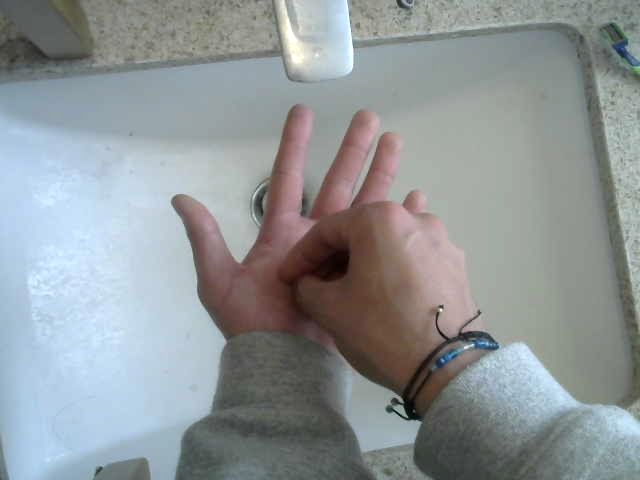

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Predicted class: step_10
Prediction counts: {'step_1': 14, 'step_9': 2, 'step_4': 1, 'step_10': 1}


<IPython.core.display.Javascript object>

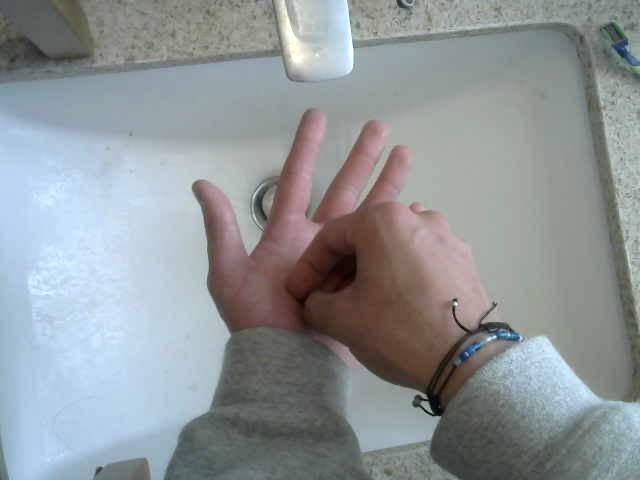

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Predicted class: step_9
Prediction counts: {'step_1': 14, 'step_9': 3, 'step_4': 1, 'step_10': 1}


<IPython.core.display.Javascript object>

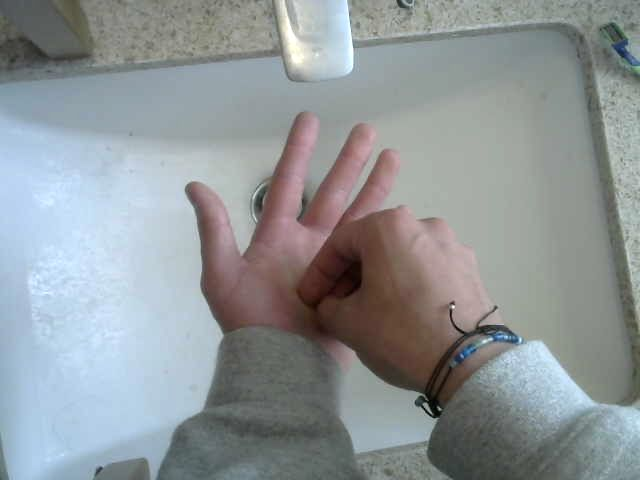

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Predicted class: step_10
Prediction counts: {'step_1': 14, 'step_9': 3, 'step_4': 1, 'step_10': 2}


<IPython.core.display.Javascript object>

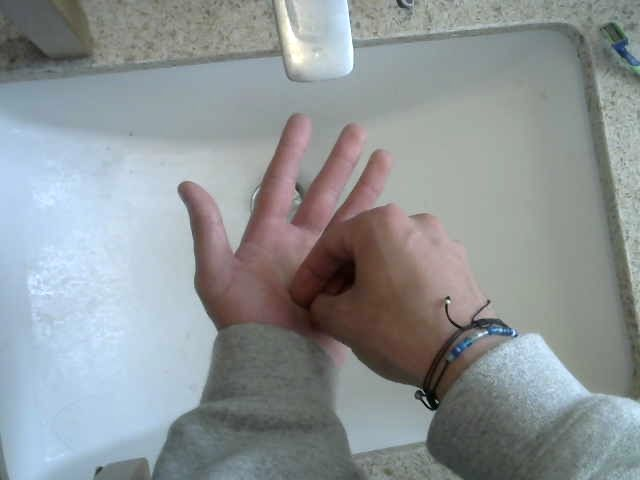

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Predicted class: step_9
Prediction counts: {'step_1': 14, 'step_9': 4, 'step_4': 1, 'step_10': 2}


<IPython.core.display.Javascript object>

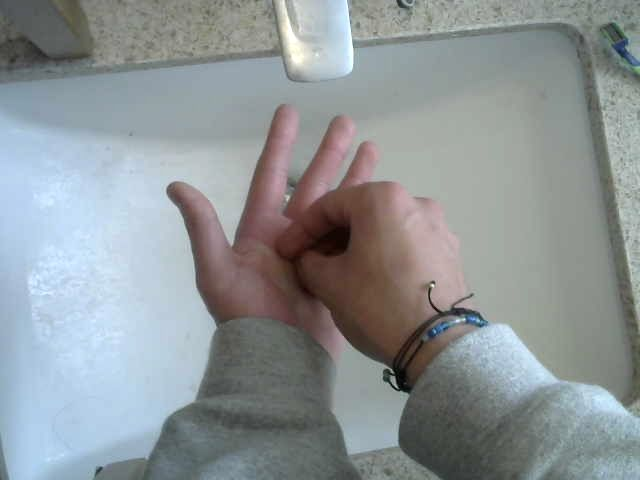

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Predicted class: step_9
Prediction counts: {'step_1': 14, 'step_9': 5, 'step_4': 1, 'step_10': 2}


<IPython.core.display.Javascript object>

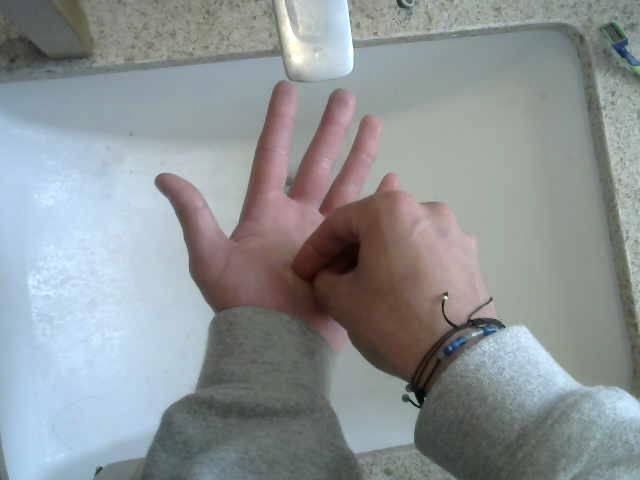

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Predicted class: step_10
Prediction counts: {'step_1': 14, 'step_9': 5, 'step_4': 1, 'step_10': 3}


<IPython.core.display.Javascript object>

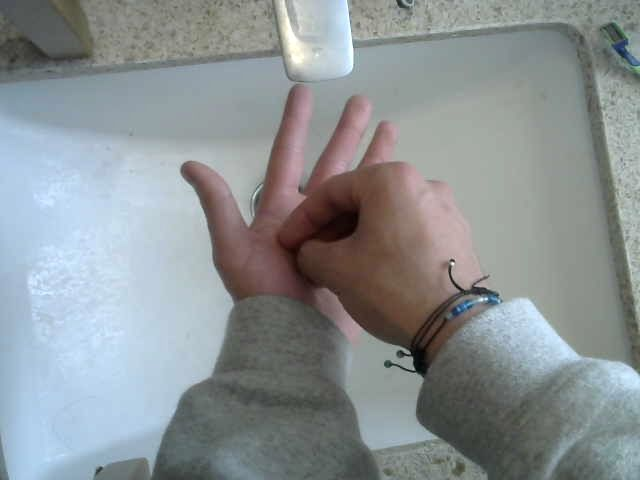

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Predicted class: step_10
Prediction counts: {'step_1': 14, 'step_9': 5, 'step_4': 1, 'step_10': 4}


<IPython.core.display.Javascript object>

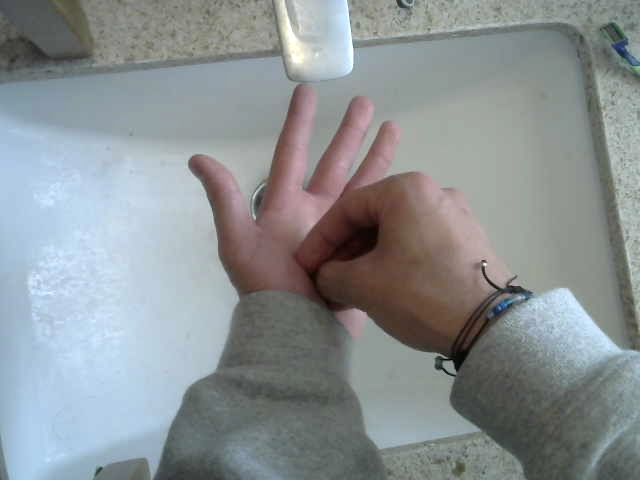

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Predicted class: step_9
Prediction counts: {'step_1': 14, 'step_9': 6, 'step_4': 1, 'step_10': 4}


<IPython.core.display.Javascript object>

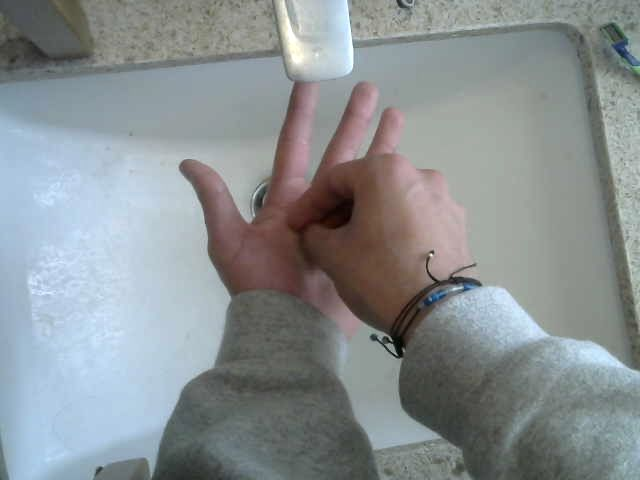

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Predicted class: step_10
Prediction counts: {'step_1': 14, 'step_9': 6, 'step_4': 1, 'step_10': 5}


<IPython.core.display.Javascript object>

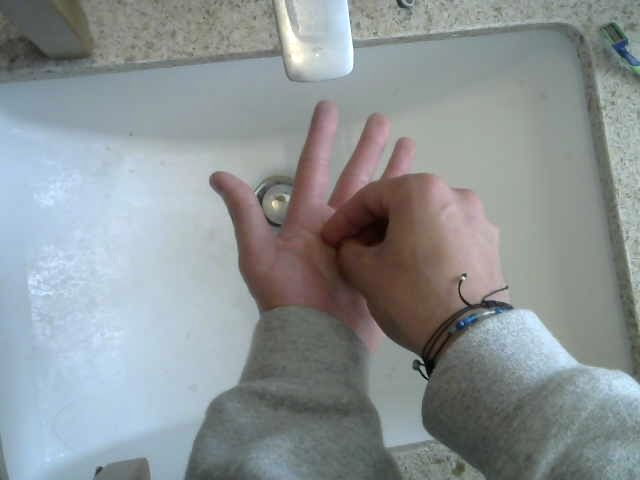

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
Predicted class: step_9
Prediction counts: {'step_1': 14, 'step_9': 7, 'step_4': 1, 'step_10': 5}


<IPython.core.display.Javascript object>

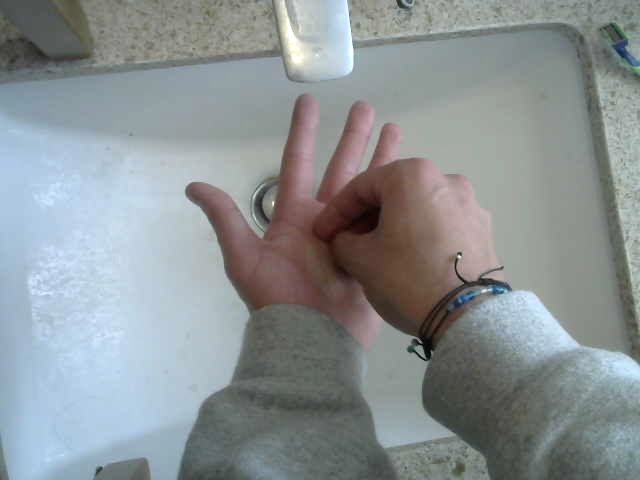

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Predicted class: step_9
Prediction counts: {'step_1': 14, 'step_9': 8, 'step_4': 1, 'step_10': 5}


<IPython.core.display.Javascript object>

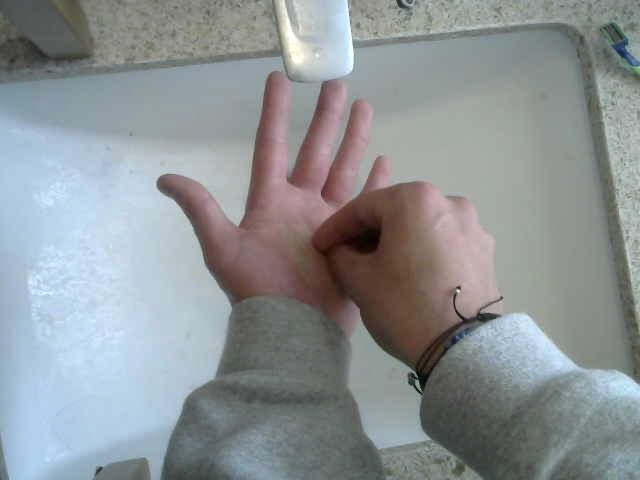

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Predicted class: step_10
Prediction counts: {'step_1': 14, 'step_9': 8, 'step_4': 1, 'step_10': 6}


<IPython.core.display.Javascript object>

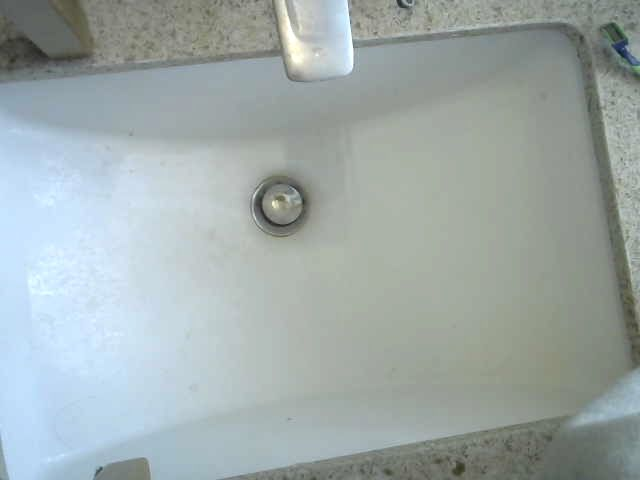

Captured frame: photo.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Predicted class: step_1
Prediction counts: {'step_1': 15, 'step_9': 8, 'step_4': 1, 'step_10': 6}


<IPython.core.display.Javascript object>

Live classification stopped.
Final prediction counts: {'step_1': 15, 'step_9': 8, 'step_4': 1, 'step_10': 6}


In [84]:
classify_live(model, class_names)

In [37]:
step_1_directory = '/content/data/outputFrames/test/step_3/'
img_height = 180
img_width = 180
color_mode = "rgb"  # Ensure this matches your model's input expectations

for filename in os.listdir(step_1_directory):
  image_path = os.path.join(step_1_directory, filename)

  processed_image = load_img(image_path, target_size=(img_height, img_width), color_mode=color_mode)

  img_array = tf.keras.utils.img_to_array(processed_image)
  img_array = tf.expand_dims(img_array, 0) # Create a batch

  predictions = model.predict(img_array)
  score = tf.nn.softmax(predictions[0])

  print(
      "This image most likely belongs to {} with a {:.2f} percent confidence."
      .format(class_names[np.argmax(score)], 100 * np.max(score))
  )

In [39]:
import os
import numpy as np
import tensorflow as tf
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Parameters
test_directory = '/content/new_test/'
img_height = 128
img_width = 128
color_mode = "rgb"

# Define class names based on subdirectory names
class_names = sorted([d for d in os.listdir(test_directory) if os.path.isdir(os.path.join(test_directory, d))])
num_classes = len(class_names)

# Initialize lists to collect true and predicted labels
true_labels = []
predicted_labels = []

# Limit to first 100 images per directory
image_limit = 100

# Loop through each class directory
for class_idx, class_name in enumerate(class_names):
    class_dir = os.path.join(test_directory, class_name)

    # Get all filenames and limit to the first 100
    filenames = sorted(os.listdir(class_dir))
    filenames = [f for f in filenames if f.lower().endswith(('.png', '.jpg', '.jpeg'))][:image_limit]

    # Loop through the limited list of images
    for filename in filenames:
        image_path = os.path.join(class_dir, filename)

        # Load and preprocess the image
        processed_image = tf.keras.utils.load_img(image_path, target_size=(img_height, img_width), color_mode=color_mode)
        img_array = tf.keras.utils.img_to_array(processed_image)
        img_array = tf.expand_dims(img_array, 0)  # Create a batch

        # Predict the label
        predictions = model.predict(img_array)
        predicted_label = np.argmax(predictions[0])
        predicted_labels.append(predicted_label)

        # Append the true label (based on the directory)
        true_labels.append(class_idx)

# Compute confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# Print classification report
print(classification_report(true_labels, predicted_labels, target_names=class_names))


ValueError: zero-size array to reduction operation fmin which has no identity

<Figure size 1000x800 with 0 Axes>

In [32]:
from sklearn.metrics import accuracy_score
accuracy_score(true_labels, predicted_labels)

0.975

In [110]:
test_loss, test_accuracy = model.evaluate(val_ds)
print("Test Accuracy from model.evaluate():", test_accuracy)


600/600 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9923 - loss: 0.0166
Test Accuracy from model.evaluate(): 0.992760419845581
